In [12]:
from google.colab import drive
import os

drive.mount('/content/gdrive', force_remount=True)
path = '/content/gdrive/My Drive/Data-Centric_Competition/Github_save/Data-Competition'
os.chdir(path)

Mounted at /content/gdrive


In [13]:
%%capture
! pip install opencv-python-headless==4.1.2.30

In [14]:
%matplotlib inline

import glob
import numpy as np
import matplotlib.pyplot as plt
import cv2

# Helper functions & Setting up

In [15]:
def img_to_arr(img_folder):
  """Load all images as arrays from a folder & save them into a list"""
  img_arrs = list()

  # make sure there's a slash to the folder path 
  img_folder += "" if img_folder[-1] == "/" else "/"
  # get all text files
  img_files = glob.glob(img_folder + "*.jpg")

  for img_f in img_files:
    # Load the images
    img_arr = cv2.imread(img_f, cv2.IMREAD_COLOR)
    img_arr = cv2.cvtColor(img_arr, cv2.COLOR_RGB2BGR)
    img_arrs.append(img_arr)

  return np.array(img_arrs)


def anno_to_arr(txt_folder):
  """Load all annotation txt file as list of boxes & save them into a list"""
  txt_arrs = list()

  # make sure there's a slash to the folder path 
  txt_folder += "" if txt_folder[-1] == "/" else "/"
  # get all text files
  txt_files = glob.glob(txt_folder + "*.txt")

  for txt_f in txt_files:
    boxes_f = list()  # List of all annotations in an image
    with open(txt_f, 'r') as fd:
      lines = fd.readlines()
      for line in lines:
        box = np.array([None]*5)
        line = line.strip().split(' ')
        box[0] = float(line[0])  # label
        box[1] = float(line[1])
        box[2] = float(line[2])
        box[3] = float(line[3])
        box[4] = float(line[4])
        boxes_f.append(box)
    
    # Append all annotations of an image
    txt_arrs.append(np.array(boxes_f))

  return np.array(txt_arrs)
  

  def yolo_to_pascal(box, img_width, img_height):
    label, xc, yc, w_box, h_box = box

    x_min_rect = ((2 * xc * img_width) - (w_box * img_width)) / 2
    x_max_rect = ((2 * xc * img_width) + (w_box * img_width)) / 2
    y_min_rect = ((2 * yc * img_height) - (h_box * img_height)) / 2
    y_max_rect = ((2 * yc * img_height) + (h_box * img_height)) / 2

    return label, x_min_rect, y_min_rect, x_max_rect, y_max_rect


In [16]:
%%capture
!pip install -U albumentations

In [17]:
%%capture
!pip install -r ./requirements.txt

# Albumentation library visualization

In [18]:
import pandas as pd
import numpy as np
import glob
import cv2
import os
import re

from PIL import Image

import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2, ToTensor

import torch
import torchvision

from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection import FasterRCNN
from torchvision.models.detection.rpn import AnchorGenerator

from torch.utils.data import DataLoader, Dataset
from torch.utils.data.sampler import SequentialSampler

from matplotlib import pyplot as plt

DIR_TRAIN = './dataset_origin/images/train'
DIR_VAL = './dataset_origin/images/val'
DIR_TEST = './dataset_origin/images/public_test'

In [19]:
train_df = pd.read_csv('./dataset_origin/train_csv.csv', index_col=False)
valid_df = pd.read_csv('./dataset_origin/val_csv.csv', index_col=False)
test_df = pd.read_csv('./dataset_origin/test_csv.csv', index_col=False)

train_df

,image_id,width,height,label,x,y,w,h
0,1035,960.0,960.0,1.0,0.704688,0.522917,0.034375,0.098611
1,1035,960.0,960.0,1.0,0.551562,0.201389,0.045312,0.077778
2,289,960.0,960.0,1.0,0.241858,0.605691,0.059107,0.162602
3,504,960.0,960.0,1.0,0.296875,0.501389,0.064062,0.077778
4,504,960.0,960.0,2.0,0.791016,0.022917,0.021094,0.031944
...,...,...,...,...,...,...,...,...
1565,1047,960.0,960.0,1.0,0.454688,0.227083,0.040625,0.073611
1566,1047,960.0,960.0,0.0,0.734375,0.472222,0.053125,0.077778
1567,1047,960.0,960.0,1.0,0.402734,0.059028,0.032031,0.054167
1568,1047,960.0,960.0,1.0,0.848437,0.021528,0.020313,0.031944


# Dataset construction

In [20]:
# HELPER FUNCTIONS
def load_image(self, index):
  # loads 1 image from dataset, returns img, original hw, resized hw
  """Load 1 image from dataset
  Input:
    index: idx to search for image's id
  Output:
    img, hw_original, hw_resized """
  # Read an image using opencv2
  image_id = self.image_ids[index]
  img = cv2.imread(f'{self.image_dir}/{image_id}.jpg', cv2.IMREAD_COLOR)
    
  assert img is not None, 'Image Not Found ' + imgpath
  h0, w0 = img.shape[:2]  # orig hw
  return img, (h0, w0)  # img, hw_original


def yolo_to_pascal(x, y, w, h, width, height):
  xmax = int((x*width) + (w * width)/2.0)
  xmin = int((x*width) - (w * width)/2.0)
  ymax = int((y*height) + (h * height)/2.0)
  ymin = int((y*height) - (h * height)/2.0)
  return xmin, ymin, xmax, ymax

In [21]:
from sklearn.utils import shuffle
import random

class FPTDataset(Dataset):
  def __init__(self, dataframe, image_dir, transforms=None):
    super().__init__()

    self.df = dataframe  # Annotation & Image's ID dataframe
    self.transforms = transforms  # Albumentation's augmentation
    self.image_ids = shuffle(dataframe['image_id'].unique())  # Image's ID
    self.labels = [np.zeros((0, 4), dtype=np.float32)] * len(self.image_ids) # Image's bboxes
    self.class_labels = [np.zeros((0, 1), dtype=np.float32)] * len(self.image_ids)  # Image's label
    self.img_size = 960
    self.image_dir = image_dir
    im_w = 1280
    im_h = 720

    # Loop through each image (Each image might containt multiple bboxes & labels)
    for i, img_id in enumerate(self.image_ids):
      records = self.df[self.df['image_id'] == img_id]
      boxes = records[['x', 'y', 'w', 'h']].values  # Annotations
      class_label = records[['label']].values
      self.labels[i] = np.array(boxes)
      self.class_labels[i] = class_label

  def __getitem__(self, index: int):
    # DATA AUGMENTATION
    if self.transforms is not None:
      # Load image
      image, (h0, w0) = load_image(self, index)

      # Augmentation
      augmented = self.transforms(image=image, bboxes=self.labels[index], class_labels=self.class_labels[index])
      image = augmented['image']
      image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # BGR to RGB
      bboxes = augmented['bboxes']
      labels = augmented['class_labels']

      return image, bboxes, labels

  def __len__(self) -> int:
    return self.image_ids.shape[0]


# Visualize Albumentation library

In [22]:
import random, math


def collate_fn(batch):
    return tuple(zip(*batch))


def aug_visualize(train_val_df, train_val_dir, transform):
  train_dataset = FPTDataset(train_val_df, train_val_dir, transform)  # 792 images
  train_data_loader = DataLoader(
      train_dataset,
      batch_size=9,
      shuffle=True,
      num_workers=4,
      collate_fn=collate_fn
  )


  fig, ax = plt.subplots(3, 3, figsize=(25, 15))
  ax = ax.flatten()
  images, targets, class_labels = next(iter(train_data_loader))

  for i in range(9):  # Go through each batch 
    boxes = targets[i]
    sample = images[i]
    height, width = sample.shape[:2]

    for box in boxes:
      # Convert from Yolo to Pascal_voc
      box = yolo_to_pascal(box[0], box[1], box[2], box[3], width, height)
      # Drawing bounding box
      cv2.rectangle(sample,
                (int(box[0]), int(box[1])),
                (int(box[2]), int(box[3])),
                220, 3)

    ax[i].imshow(sample)  # Visualize a sample for each batch
  plt.show()

## channelDropout

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


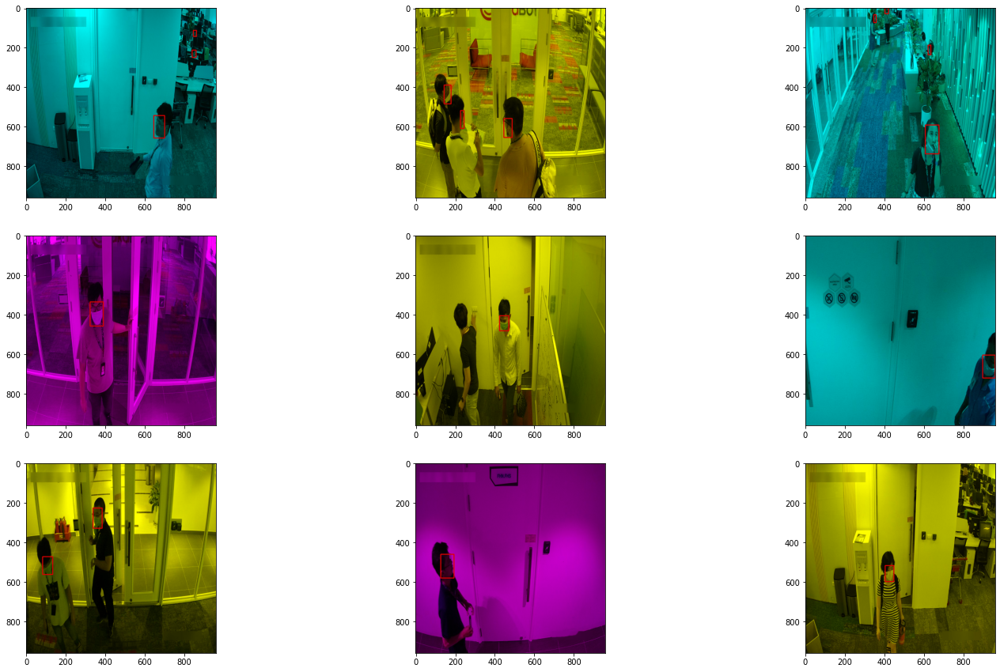

In [23]:
# Drop channel of image
def channelDropout():
  return A.Compose([
      A.augmentations.transforms.ChannelDropout (channel_drop_range=(1, 1), fill_value=0, always_apply=False, p=1.0),
      A.augmentations.geometric.resize.Resize(960, 960, interpolation=1, always_apply=False, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))


channelDropout_obj = channelDropout()
aug_visualize(train_df, DIR_TRAIN, channelDropout_obj)

## Equalize

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


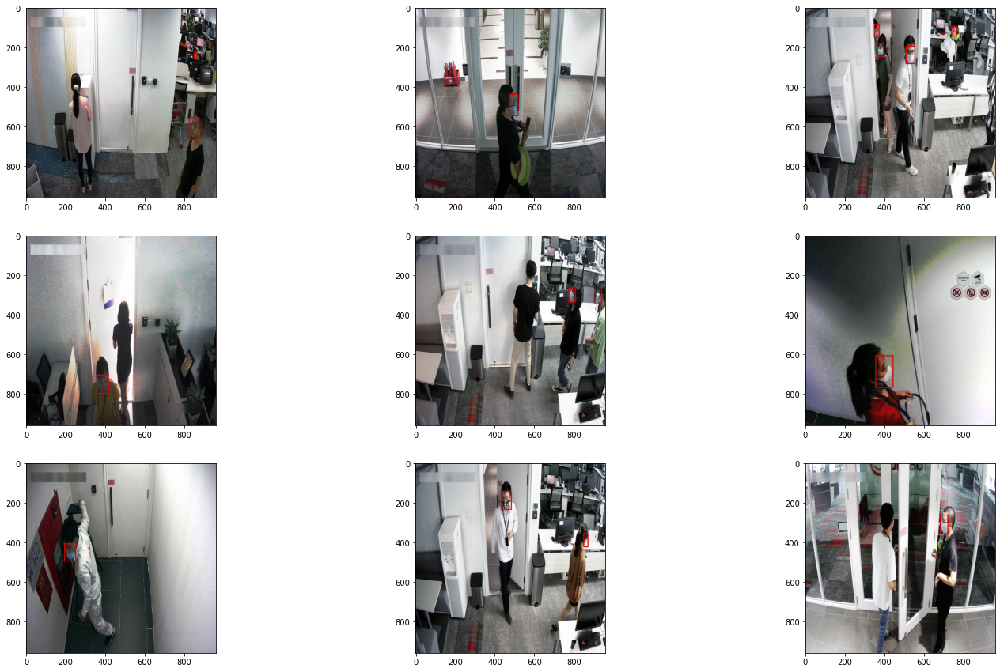

In [26]:
# Equalize the image histogram.
# Link: https://albumentations.ai/docs/api_reference/augmentations/transforms/#albumentations.augmentations.transforms.Equalize
def equalize():
  return A.Compose([
      A.augmentations.transforms.Equalize(mode='cv', by_channels=True, mask=None, mask_params=(), always_apply=False, p=1.0),
      A.augmentations.geometric.resize.Resize(960, 960, interpolation=1, always_apply=False, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

equalize_obj = equalize()
aug_visualize(train_df, DIR_TRAIN, equalize_obj)

## Gaussian noise

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


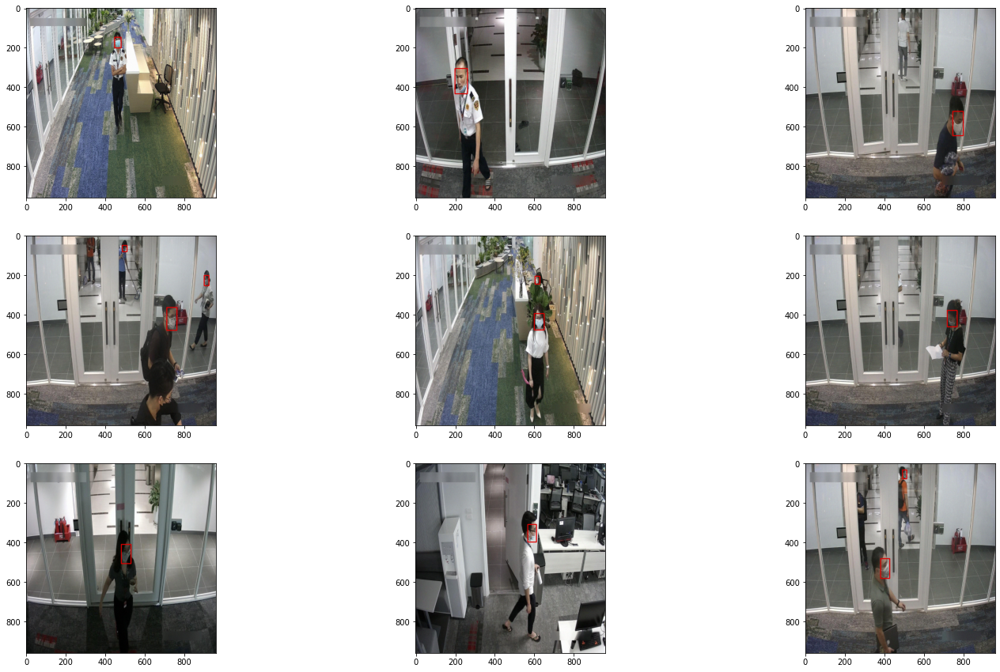

In [27]:
# Apply gaussian noise to the input image.
# Link: https://albumentations.ai/docs/api_reference/augmentations/transforms/#albumentations.augmentations.transforms.GaussNoise
def gaussNoise():
  return A.Compose([
      A.augmentations.transforms.GaussNoise (var_limit=(10.0, 50.0), mean=0, per_channel=True, always_apply=False, p=1.0),
      A.augmentations.geometric.resize.Resize(960, 960, interpolation=1, always_apply=False, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

gaussNoise_obj = gaussNoise()
aug_visualize(train_df, DIR_TRAIN, gaussNoise_obj)

## Random brightness contrast

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


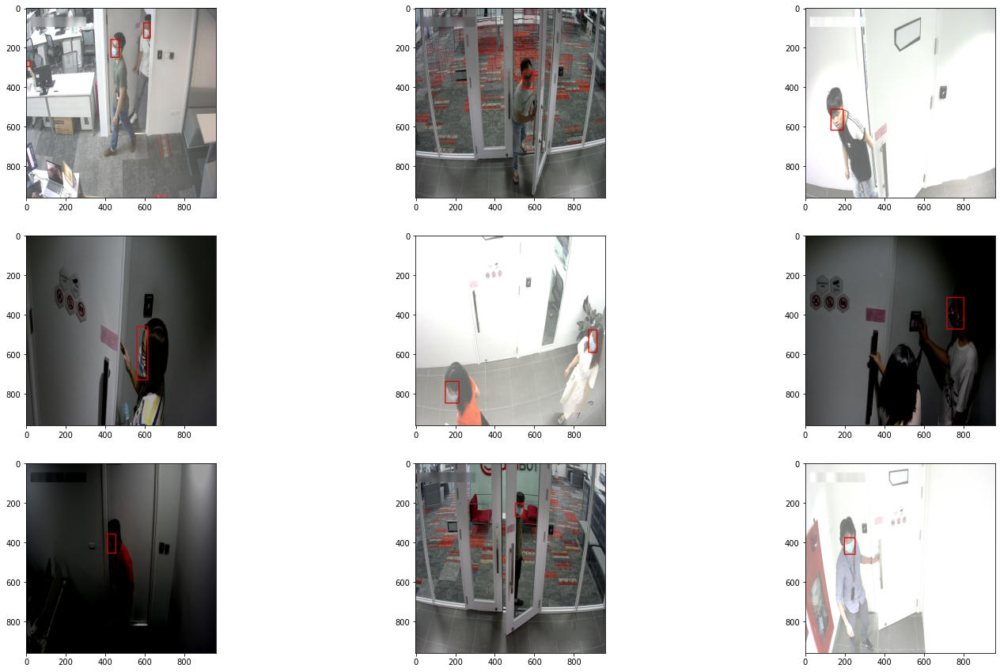

In [28]:
# Randomly change brightness and contrast of the input image.
# Link: https://albumentations.ai/docs/api_reference/augmentations/transforms/#albumentations.augmentations.transforms.RandomBrightnessContrast
def randomBrightnessContrast():
  return A.Compose([
      # A.augmentations.transforms.RandomBrightnessContrast (brightness_limit=0.1, contrast_limit=0.2, brightness_by_max=True, always_apply=False, p=1.0),
      A.RandomBrightnessContrast (brightness_limit=0.5, contrast_limit=0.2, brightness_by_max=True, always_apply=False, p=1.0),
      A.augmentations.geometric.resize.Resize(960, 960, interpolation=1, always_apply=False, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))


randomBrightnessContrast_obj = randomBrightnessContrast()
aug_visualize(train_df, DIR_TRAIN, randomBrightnessContrast_obj)

## Random shadow

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


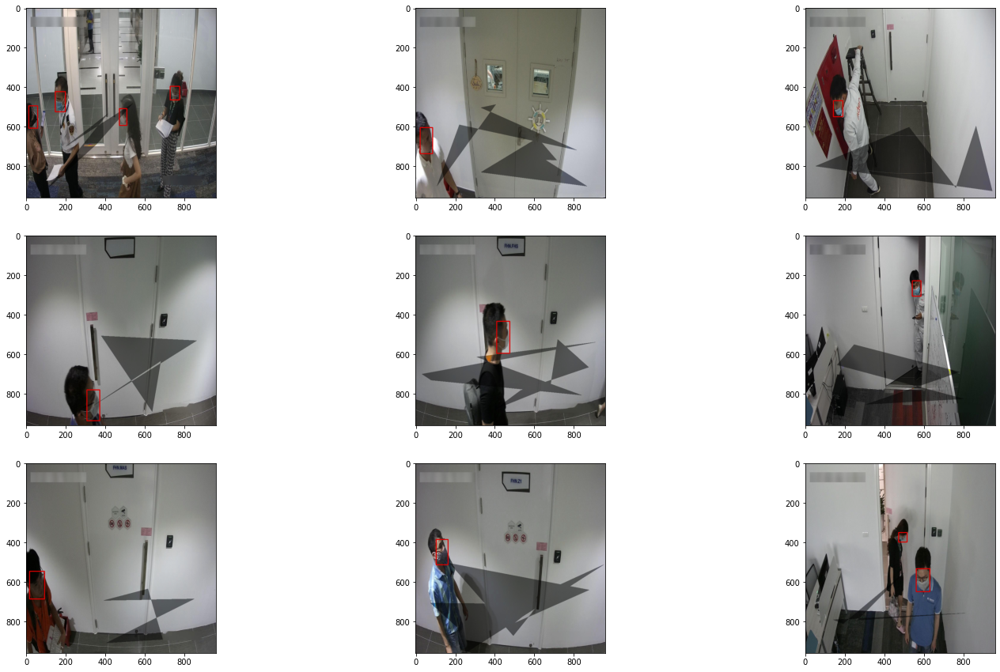

In [29]:
# Simulates shadows for the image
# Link: https://albumentations.ai/docs/api_reference/augmentations/transforms/#albumentations.augmentations.transforms.RandomShadow
def randomShadow():
  return A.Compose([
      A.augmentations.transforms.RandomShadow(shadow_roi=(0, 0.5, 1, 1), num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=5, always_apply=False, p=1.0),
      A.augmentations.geometric.resize.Resize(960, 960, interpolation=1, always_apply=False, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

randomShadow_obj = randomShadow()
aug_visualize(train_df, DIR_TRAIN, randomShadow_obj)

## RandomToneCurve

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


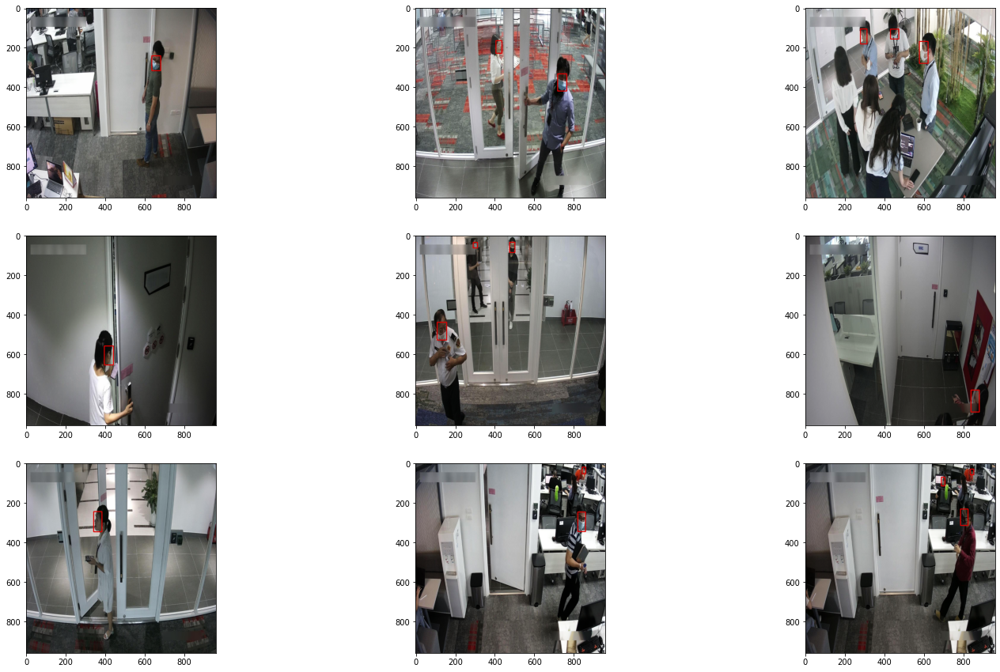

In [30]:
# Randomly change the relationship between bright and dark areas of the image by manipulating its tone curve.
# Link: https://albumentations.ai/docs/api_reference/augmentations/transforms/#albumentations.augmentations.transforms.RandomToneCurve
def RandomToneCurve():
  return A.Compose([
      A.augmentations.transforms.RandomToneCurve (scale=0.1, always_apply=False, p=1.0),
      A.augmentations.geometric.resize.Resize(960, 960, interpolation=1, always_apply=False, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

RandomToneCurve_obj = RandomToneCurve()
aug_visualize(train_df, DIR_TRAIN, RandomToneCurve_obj)

## Cutout

/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:691: FutureWarning: This class has been deprecated. Please use CoarseDropout
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


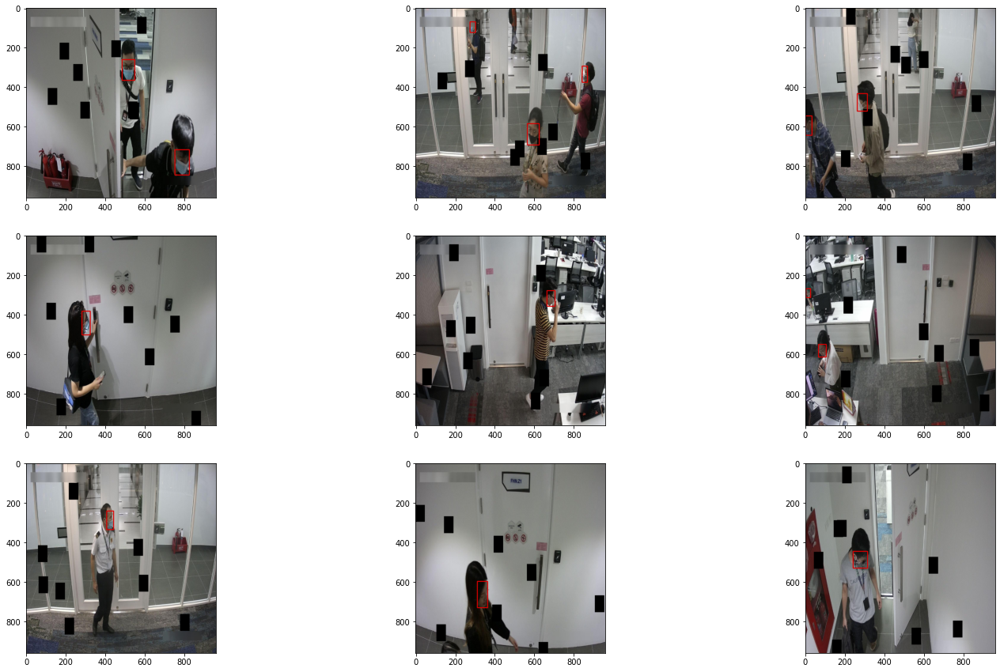

In [32]:
def cutOut():
  return A.Compose([
      A.Cutout(num_holes=8, max_h_size=64, max_w_size=64, fill_value=0, p=1.0),
      # A.augmentations.geometric.resize.Resize(720, 1280, interpolation=1, always_apply=False, p=1.0),
      A.Resize(960, 960, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

cutOut_obj = cutOut()
aug_visualize(train_df, DIR_TRAIN, cutOut_obj)

## RandomSizedBBoxSafeCrop

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


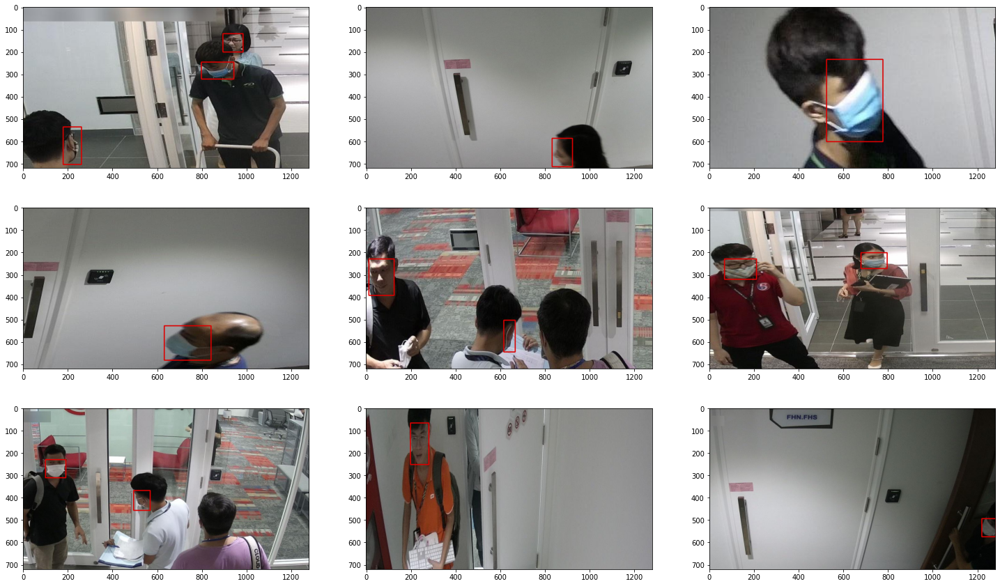

In [34]:
def RandomSizedBBoxSafeCrop():
  return A.Compose([
      A.RandomSizedBBoxSafeCrop(720, 1280, erosion_rate=0, interpolation=cv2.INTER_AREA, p=1.0),
      # A.augmentations.geometric.resize.Resize(720, 1280, interpolation=1, always_apply=False, p=1.0),
      # A.Resize(960, 960, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

RandomSizedBBoxSafeCrop_obj = RandomSizedBBoxSafeCrop()
aug_visualize(train_df, DIR_TRAIN, RandomSizedBBoxSafeCrop_obj)

# Rotation

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


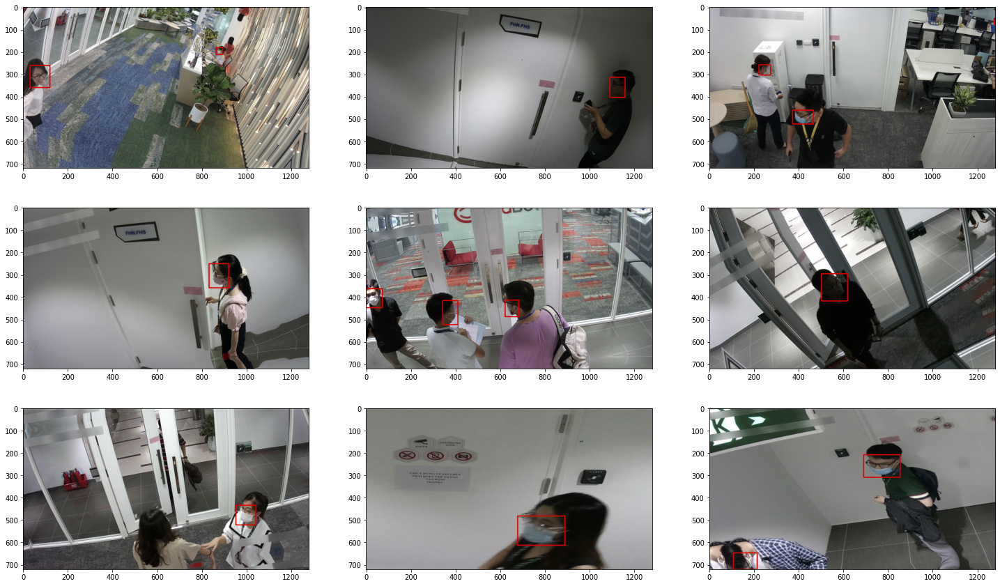

In [35]:
def Rotate():
  return A.Compose([
      A.augmentations.geometric.rotate.Rotate (limit=30, p=1.0),
      A.augmentations.geometric.resize.Resize(720, 1280, interpolation=1, always_apply=False, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

rotate_obj = Rotate()
aug_visualize(train_df, DIR_TRAIN, rotate_obj)

## Shearing

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


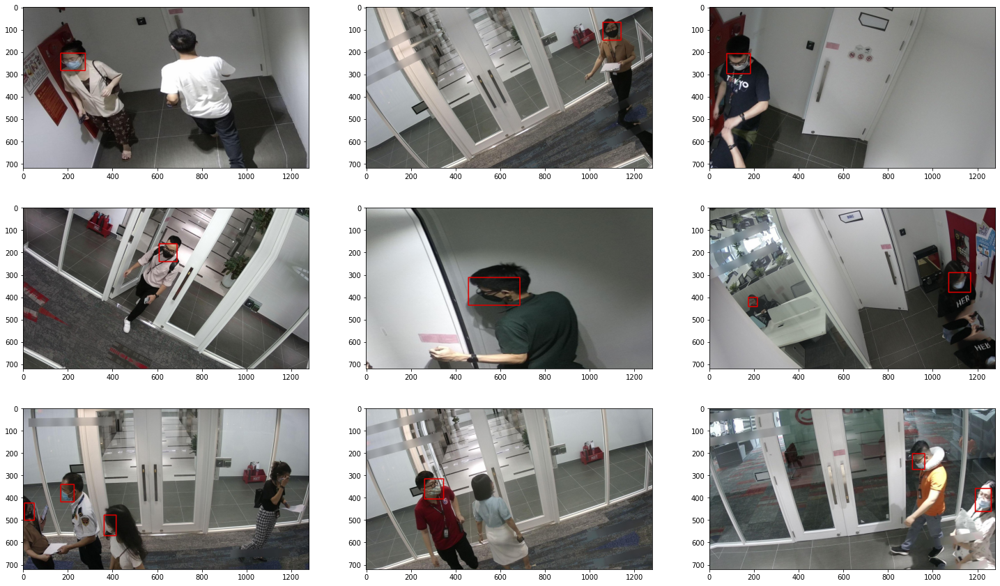

In [36]:
def Shear():
  return A.Compose([
      A.augmentations.geometric.transforms.Affine(shear=[-30,30], interpolation=1, p=1.0),
      A.augmentations.geometric.resize.Resize(720, 1280, interpolation=1, always_apply=False, p=1.0),
  ], p=1.0, 
  # This "format" here is for coordinate of the input
  bbox_params=A.BboxParams(format='yolo', label_fields=['class_labels']))

rotate_obj = Rotate()
aug_visualize(train_df, DIR_TRAIN, rotate_obj)